# **Color Spaces**
Color spaces are mathematical models used to represent colors in images. Each color space has its own unique way of representing colors, and they are chosen based on the specific requirements of the image processing task at hand. Here are some commonly used color spaces in image processing:

1. **RGB (Red, Green, Blue)**:
   - RGB is the most common color space used in digital imaging. It represents colors using combinations of red, green, and blue channels.
   - In RGB, each pixel is represented by three values ranging from 0 to 255 (or 0 to 1 in floating-point representation) for each of the three color channels.
   - RGB is widely used in computer monitors, digital cameras, and other devices that display or capture color images.

2. **Grayscale**:
   - Grayscale is not technically a color space but rather a single-channel representation of an image where each pixel's intensity is represented by a single value ranging from black (0) to white (255).
   - Grayscale images are obtained by converting color images to a single channel, typically by averaging the intensities of the RGB channels.
   - Grayscale images are commonly used in image processing tasks where color information is not necessary, such as edge detection, image enhancement, and feature extraction.

3. **HSV (Hue, Saturation, Value)**:
   - HSV is a cylindrical color space that separates color information into three components: hue, saturation, and value.
   - Hue represents the dominant wavelength of the color (e.g., red, green, blue).
   - Saturation represents the purity or intensity of the color.
   - Value represents the brightness or lightness of the color.
   - HSV is often used in image processing tasks such as color segmentation, object tracking, and color-based image analysis.

4. **Lab (CIELAB)**:
   - Lab is a device-independent color space defined by the International Commission on Illumination (CIE).
   - Lab separates color information into three components: L* (lightness), a* (green to red), and b* (blue to yellow).
   - Lab is designed to approximate human perception of color and is useful for tasks such as color correction, color matching, and color grading.

5. **YCbCr**:
   - YCbCr is a color space commonly used in video compression and transmission.
   - YCbCr separates color information into three components: Y (luminance), Cb (blue chrominance), and Cr (red chrominance).
   - YCbCr is often used in image and video compression algorithms such as JPEG and MPEG, where chrominance information is subsampled to reduce file size while preserving image quality.

These are just a few examples of the many color spaces used in image processing. Each color space has its own advantages and is chosen based on factors such as application requirements, computational efficiency, and human perception.

In this lesson we'll learn to:
1. View the individual channels of an RGB Image
2. Manipulate a color space
3. Introduce HSV Color Spaces

In [16]:
# Our Setup, Import Libaries, Create our Imshow Function and Download our Images
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Define our imshow function 
def imshow(title = "Image", image = None, size = 10):
    w, h = image.shape[0], image.shape[1]
    aspect_ratio = w/h
    plt.figure(figsize=(size * aspect_ratio,size))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.show()

In [17]:
# Load our input image
image = cv2.imread('./image/lena.png')

# Use cv2.split to get each color space separately
B, G, R = cv2.split(image)
print(B.shape)
print(G.shape)
print(R.shape)

(512, 512)
(512, 512)
(512, 512)


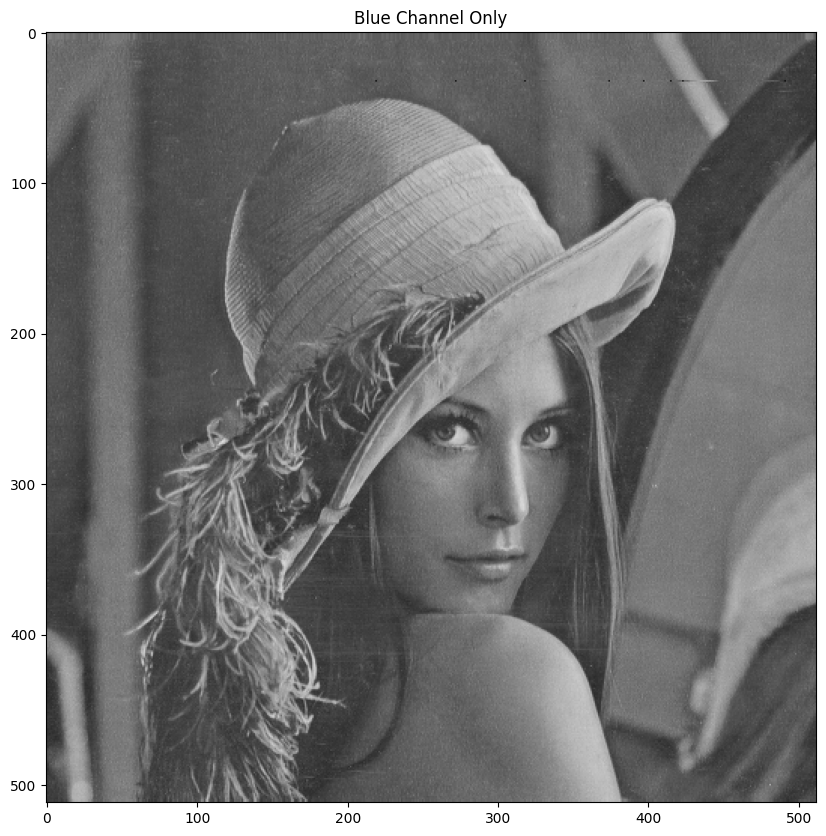

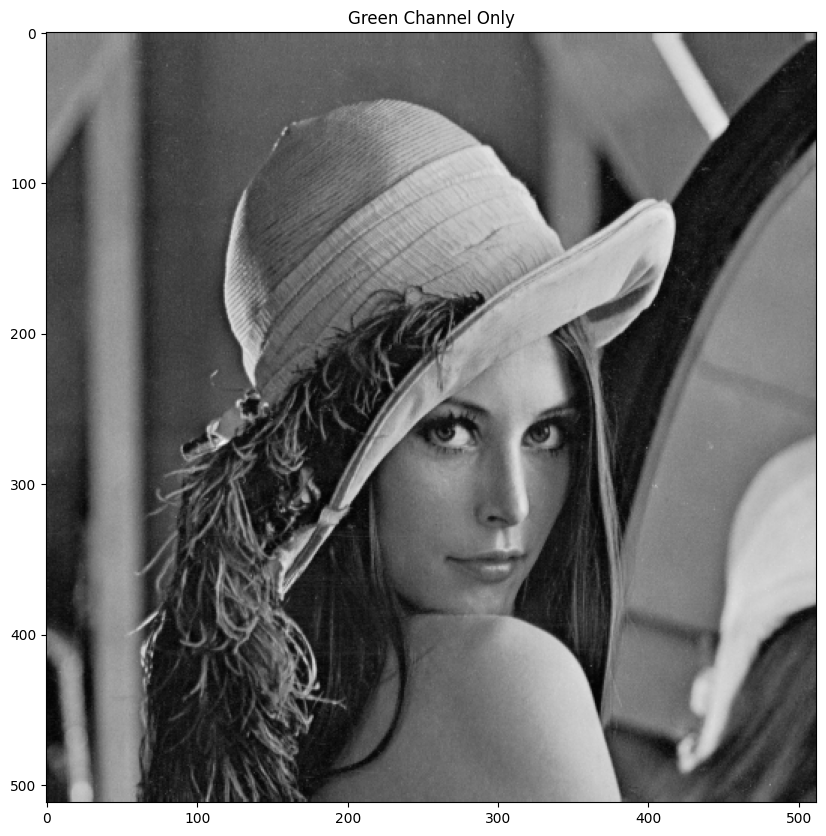

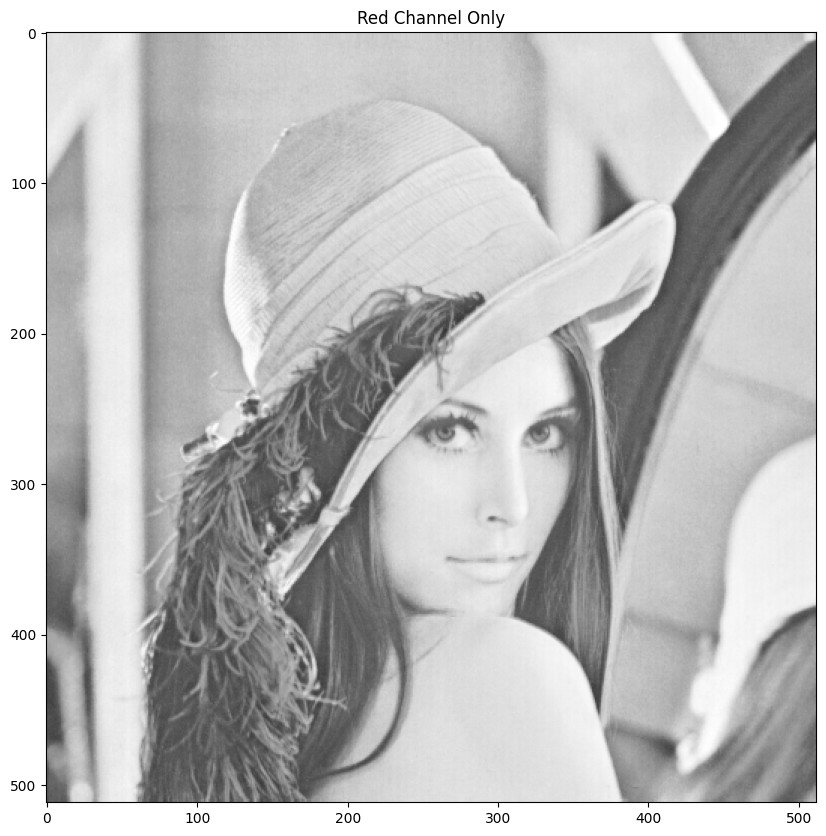

In [18]:
# Each color space on it's on will look like a grayscale as it lacks the other color channels
imshow("Blue Channel Only", B)
imshow("Green Channel Only", G)
imshow("Red Channel Only", R)

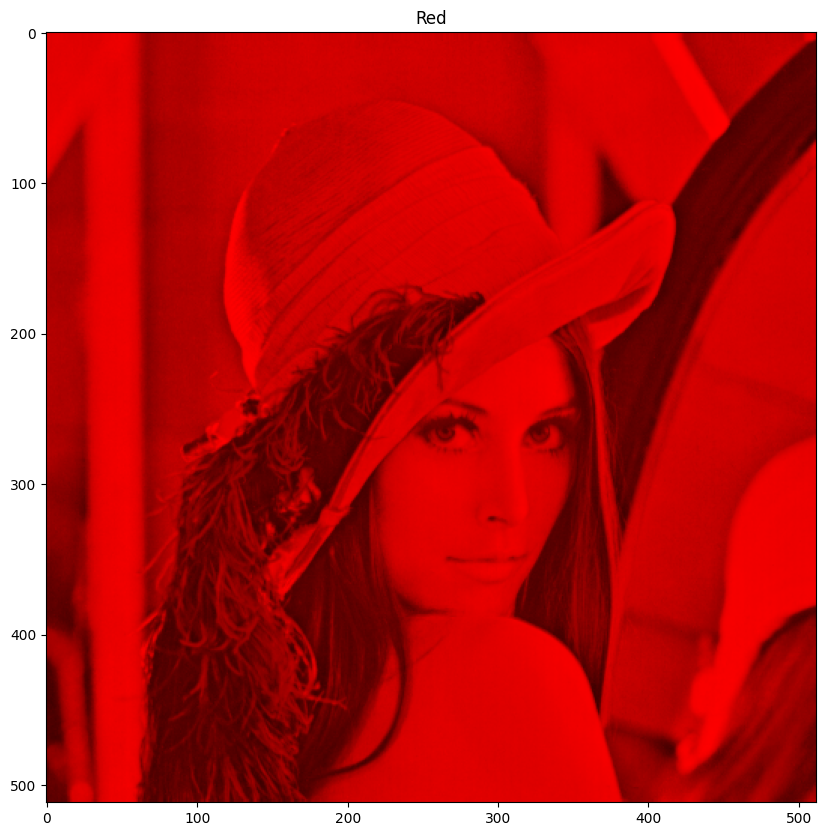

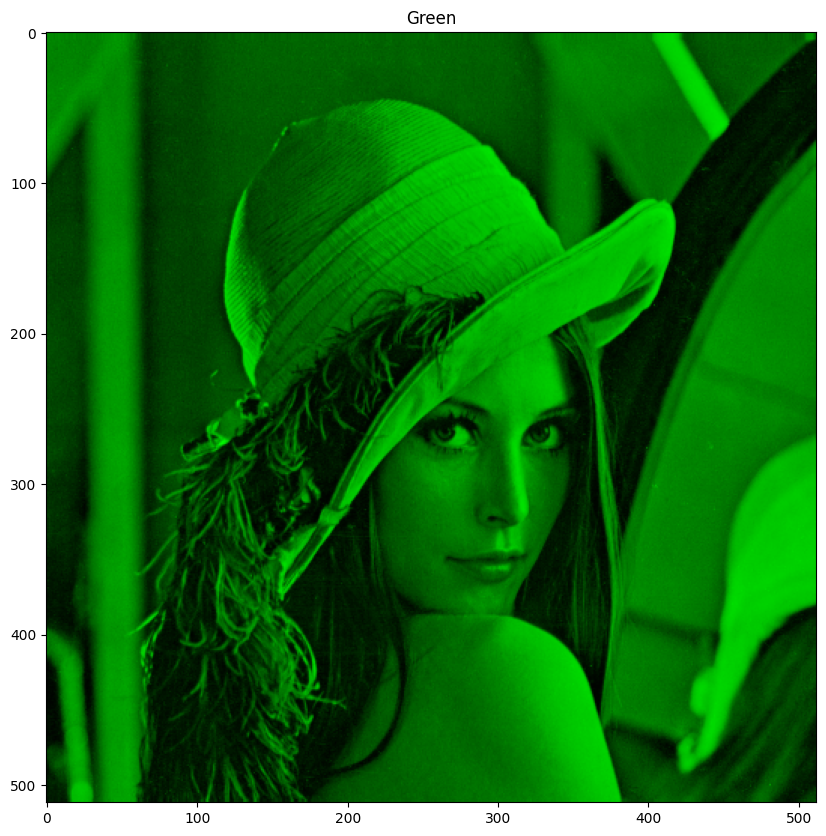

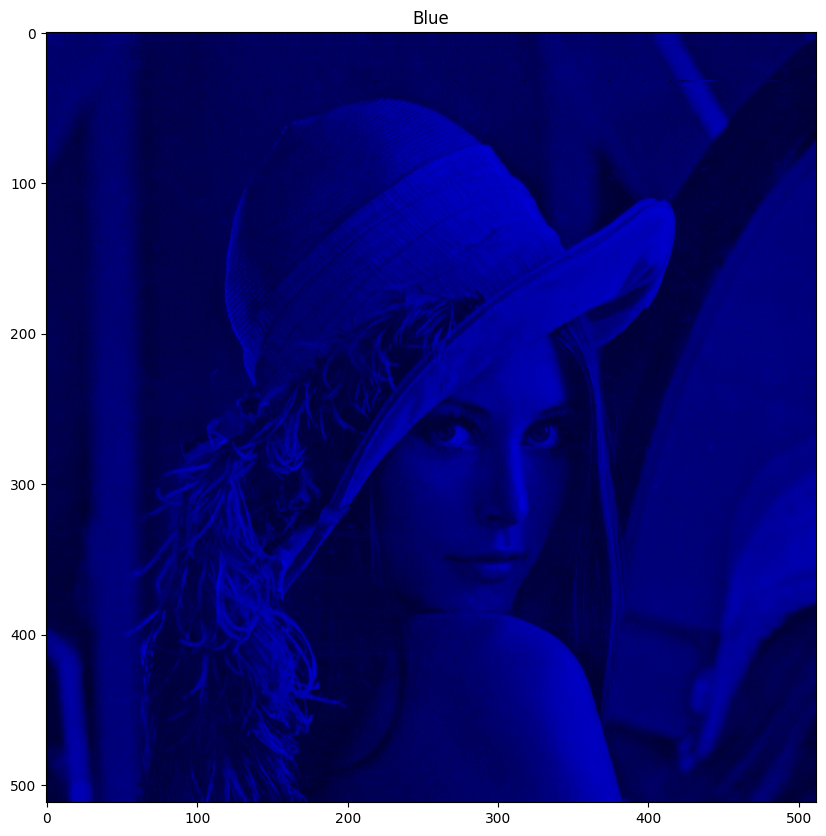

In [19]:
import numpy as np

# Let's create a matrix of zeros 
# with dimensions of the image h x w  
zeros = np.zeros(image.shape[:2], dtype = "uint8")

imshow("Red", cv2.merge([zeros, zeros, R]))
imshow("Green", cv2.merge([zeros, G, zeros]))
imshow("Blue", cv2.merge([B, zeros, zeros]))

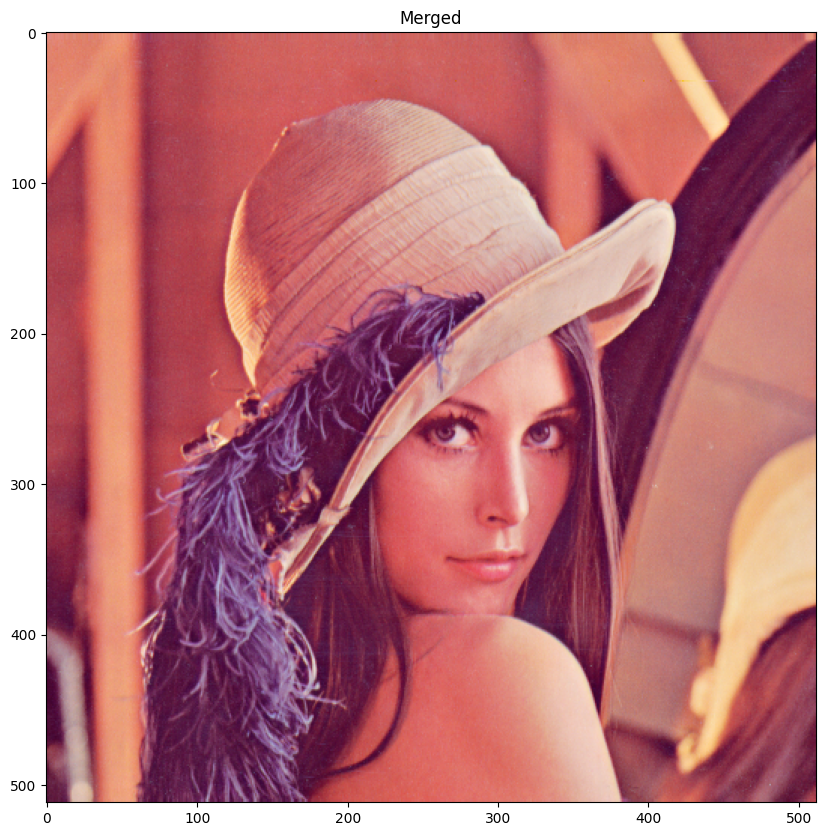

In [20]:
image = cv2.imread('./image/lena.png')

# OpenCV's 'split' function splites the image into each color index
B, G, R = cv2.split(image)

# Let's re-make the original image, 
merged = cv2.merge([B, G, R]) 
imshow("Merged", merged) 

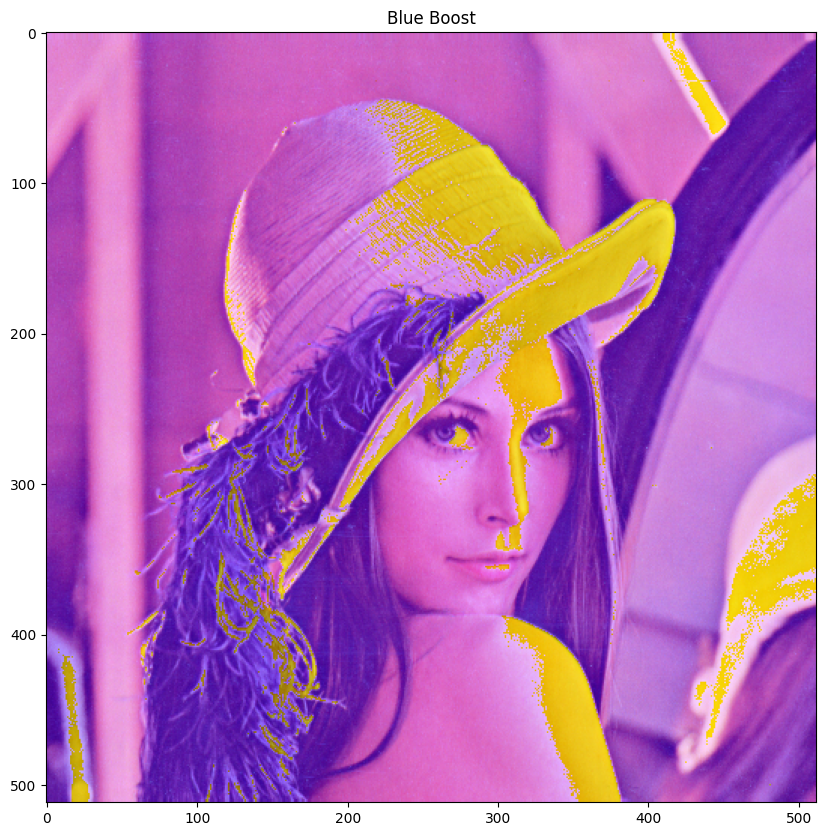

In [21]:
# Let's amplify the blue color
merged = cv2.merge([B+100, G, R])
imshow("Blue Boost", merged)

## **The HSV Color Space**

![](https://upload.wikimedia.org/wikipedia/commons/f/f2/HSV_color_solid_cone.png)

- Hue: 0 - 179 
- Saturation: 0 - 255
- Value (Intensity): 0 - 255

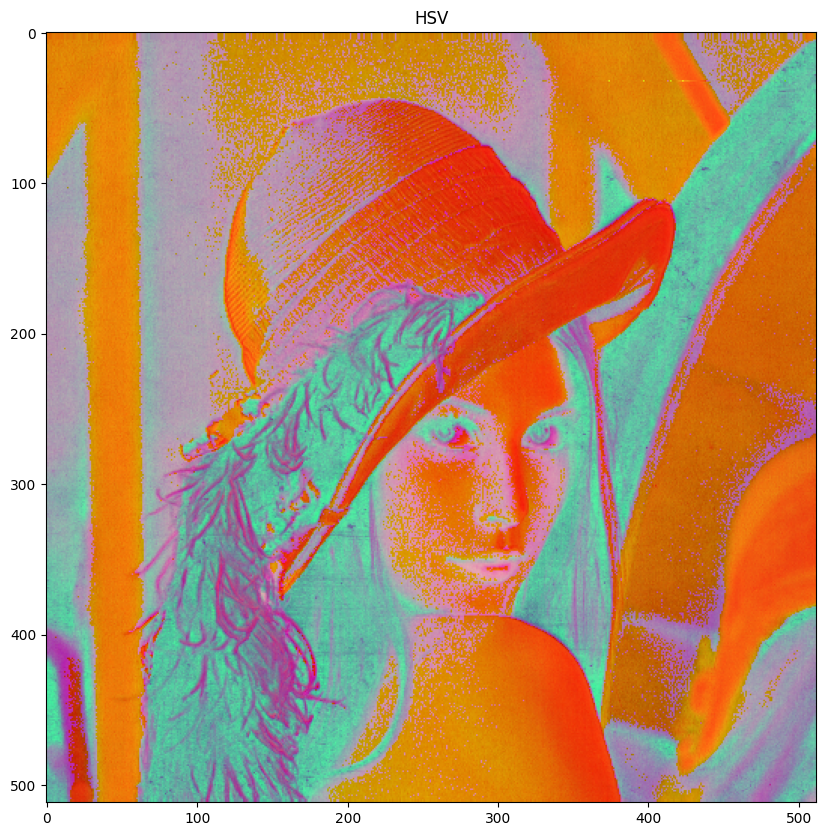

In [22]:
# Reload our image
image = cv2.imread('./image/lena.png')

# Convert to HSV
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
imshow('HSV', hsv_image)

#### This looks odd....why? 

Because our plotting function was designed for RGB only images, not HSV

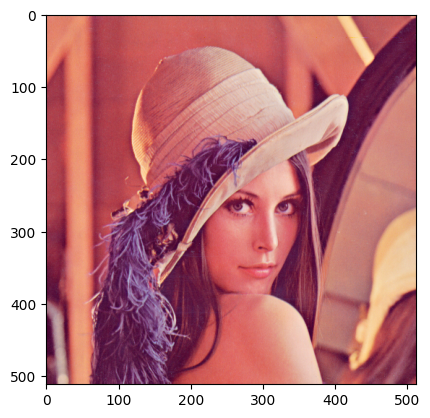

In [23]:
plt.imshow(cv2.cvtColor(hsv_image, cv2.COLOR_HSV2RGB))
plt.show()

### **Let's view each channel type in the HSV Color Space representation**

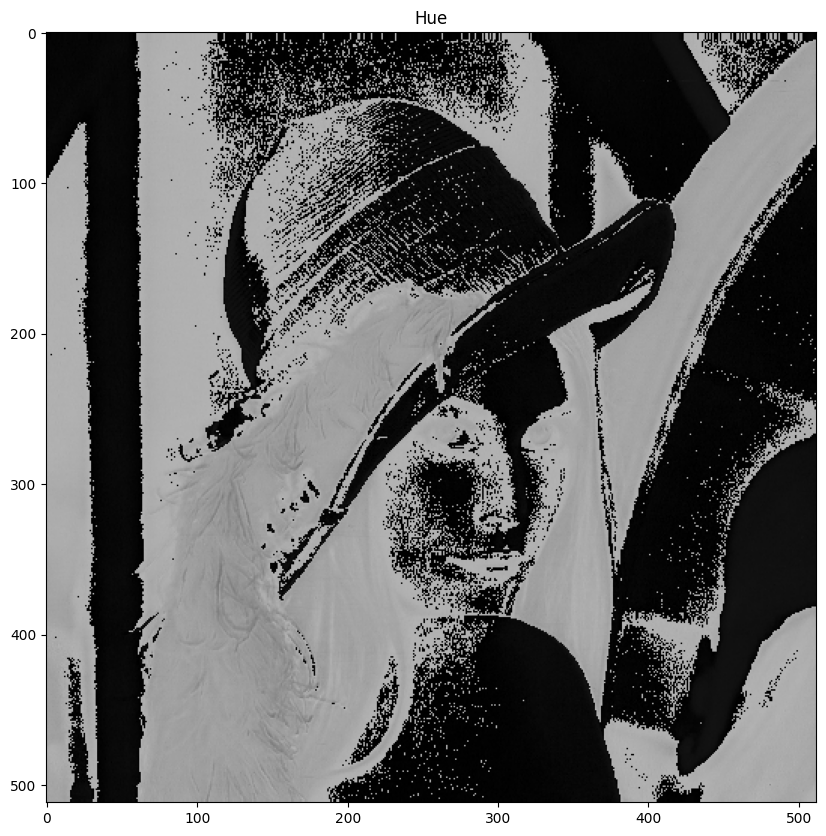

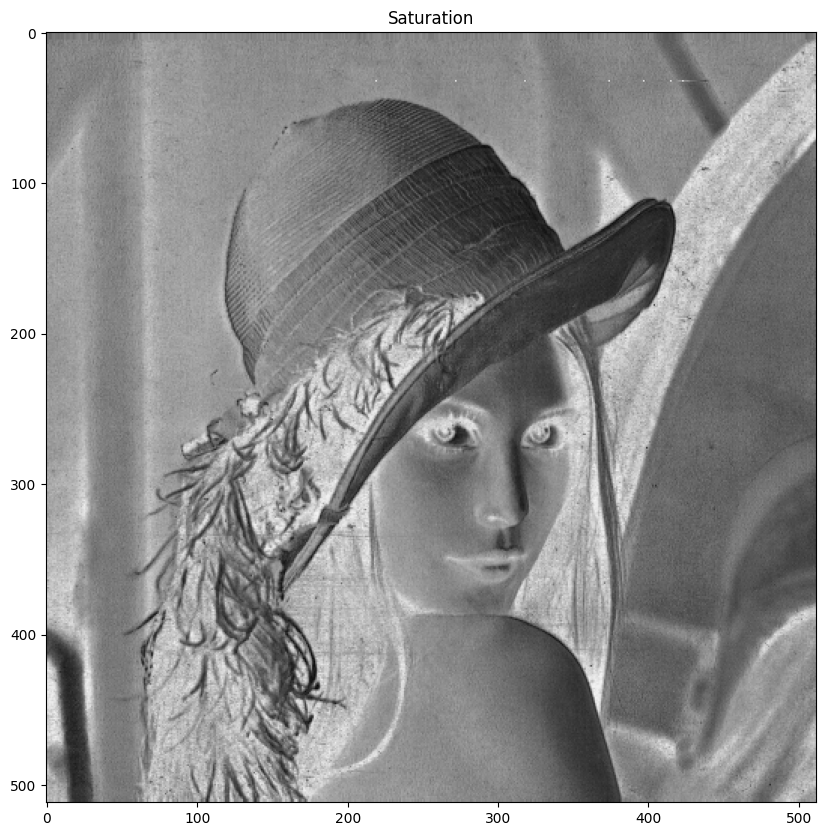

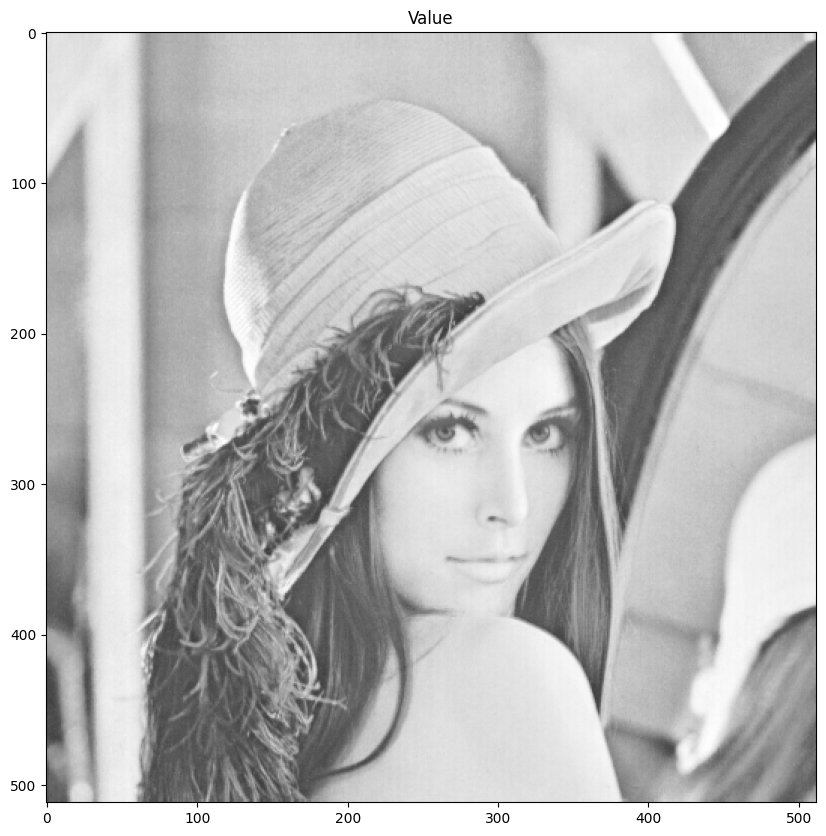

In [24]:
# Switching back to viewing the RGB representation
imshow("Hue", hsv_image[:, :, 0])
imshow("Saturation", hsv_image[:, :, 1])
imshow("Value", hsv_image[:, :, 2])